In [ ]:
from google.colab import files
files.upload()


Saving kaggle (2).json to kaggle (2).json


{'kaggle (2).json': b'{"username":"apekshamb","key":"6395641bb57edb83b8a8ab0c788fde58"}'}

In [ ]:
!pip install kaggle


In [ ]:
# Create the .kaggle directory
!mkdir -p ~/.kaggle

In [ ]:
# Move kaggle.json to the .kaggle directory
!cp kaggle.json ~/.kaggle/

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!ls

drive  sample_data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/ML_AI_vs_Real/kaggle.json ~/.kaggle/


In [ ]:
# Set the permissions to read-only for the user
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                          title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
lainguyn123/student-performance-factors                      Student Performance Factors                         94KB  2024-09-02 10:53:57          31115        553  1.0              
prajwaldongre/top-100-healthiest-food-in-the-world           100 Healthiest Foods:Nutrition and Origin dataset    3KB  2024-10-11 09:40:41            842         25  1.0              
valakhorasani/mobile-device-usage-and-user-behavior-dataset  Mobile Device Usage and User Behavior Dataset       11KB  2024-09-28 20:21:12           4736         87  1.0              
abdulszz/spotify-most-streamed-songs                         Spotify Most Stream

In [ ]:
!kaggle datasets download -d ravidussilva/real-ai-art


Dataset URL: https://www.kaggle.com/datasets/ravidussilva/real-ai-art
License(s): other
100% 9.93G/9.95G [02:31<00:00, 47.7MB/s]
100% 9.95G/9.95G [02:31<00:00, 70.6MB/s]


In [ ]:
!unzip real-ai-art.zip -d /content/real-ai-art


Streaming output truncated to the last 5000 lines.
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_114.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_116.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_142.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_154.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_183.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_186.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_201.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_219.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_230.jpg  
  inflating: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e/adachi-ginko_274.jpg  
  inflating: /conte

In [ ]:
!pip install matplotlib-venn

In [ ]:
!apt-get -qq install -y libfluidsynth1

E: Package 'libfluidsynth1' has no installation candidate


In [ ]:
# https://pypi.python.org/pypi/pydot
!apt-get -qq install -y graphviz && pip install pydot
import pydot

In [ ]:
!pip install cartopy
import cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 87.1 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow keras-tuner --upgrade


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 8.7 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.17.0


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Rescaling, Conv2D, MaxPooling2D, Flatten, Dense,
    BatchNormalization, Activation, Dropout
)
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

import keras_tuner as kt


In [ ]:
import os
import random
from matplotlib import pyplot as plt
import cv2

import numpy as np
import pandas as pd

In [ ]:
import os

# Define the top-level directory
top_dir = '/content/real-ai-art/Real_AI_SD_LD_Dataset'

# Define the training paths
train_dir = os.path.join(top_dir, 'train')

# List all directories in the train directory
all_directories = os.listdir(train_dir)

# Initialize lists to store directories for human-drawn and AI-generated images
train_human = []
train_ai = []

# Loop through all directories
for directory in all_directories:
    # Check if the directory represents human-drawn images
    if not directory.startswith('AI_'):
        train_human.append(os.path.join(train_dir, directory))
    # Check if the directory represents AI-generated images
    else:
        train_ai.append(os.path.join(train_dir, directory))

# Print the lists of directories
print("Train directories containing human-drawn images:")
for i, directory in enumerate(train_human):
    print(f"{i}. {directory}")

print("\nTrain directories containing AI-generated images:")
for i, directory in enumerate(train_ai):
    print(f"{i}. {directory}")


Train directories containing human-drawn images:
0. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/romanticism
1. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/impressionism
2. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e
3. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/surrealism
4. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/realism
5. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/art_nouveau
6. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/expressionism
7. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/renaissance
8. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/post_impressionism
9. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/baroque

Train directories containing AI-generated images:
0. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_SD_expressionism
1. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_LD_post_impressionism
2. /content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_LD_surrealism
3. /content/real-ai-art/Real_AI_SD_LD_Datase

In [ ]:
import os

# Define the top-level directory
top_dir = '/content/real-ai-art/Real_AI_SD_LD_Dataset'

# Define the test paths
test_dir = os.path.join(top_dir, 'test')

# List all directories in the test directory
all_directories = os.listdir(test_dir)

# Initialize lists to store directories for human-drawn and AI-generated images
test_human = []
test_ai = []

# Loop through all directories
for directory in all_directories:
    # Check if the directory represents human-drawn images
    if not directory.startswith('AI_'):
        test_human.append(os.path.join(test_dir, directory))
    # Check if the directory represents AI-generated images
    else:
        test_ai.append(os.path.join(test_dir, directory))

# Print the lists of directories
print("Test directories containing human-drawn images:")
for i, directory in enumerate(test_human):
    print(f"{i}. {directory}")

print("\nTest directories containing AI-generated images:")
for i, directory in enumerate(test_ai):
    print(f"{i}. {directory}")


Test directories containing human-drawn images:
0. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/romanticism
1. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/impressionism
2. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/ukiyo_e
3. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/surrealism
4. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/realism
5. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/art_nouveau
6. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/expressionism
7. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/renaissance
8. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/post_impressionism
9. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/baroque

Test directories containing AI-generated images:
0. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/AI_SD_expressionism
1. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/AI_LD_post_impressionism
2. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/AI_LD_surrealism
3. /content/real-ai-art/Real_AI_SD_LD_Dataset/test/AI_SD_re

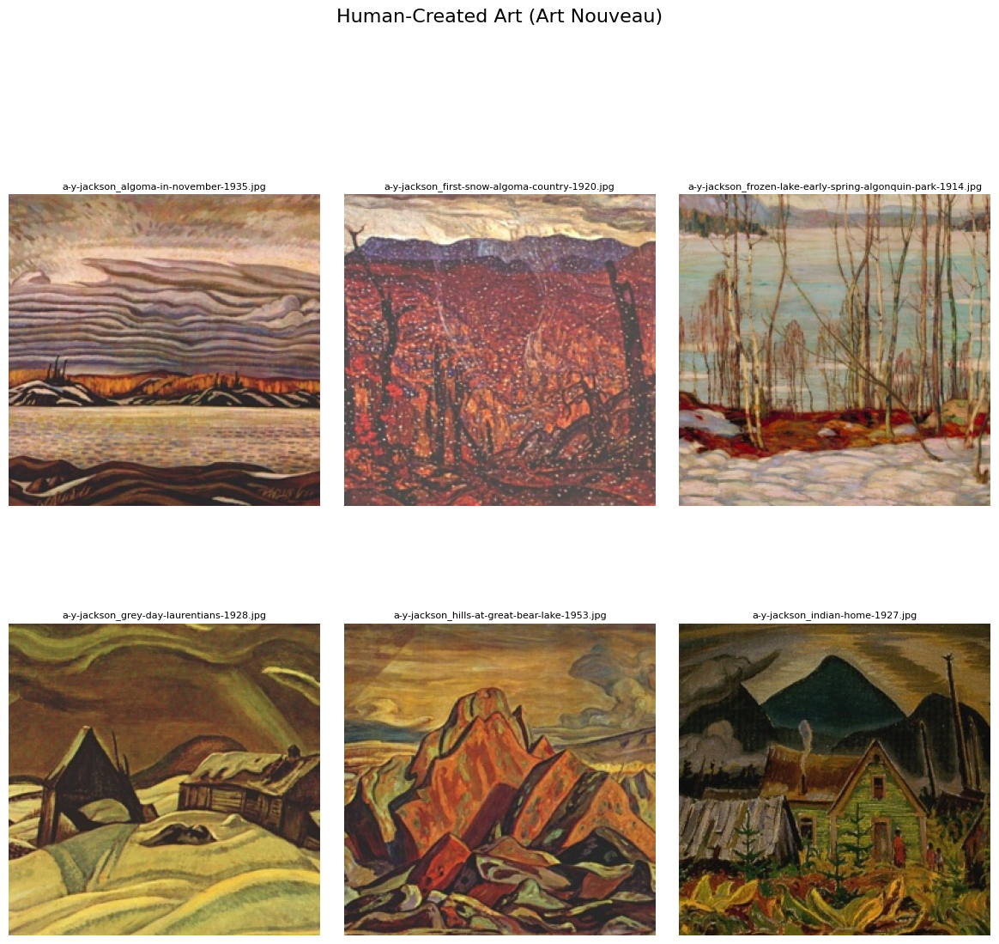

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to plot the first k images from a specified directory
def plot_im(directory, k, title):
    # Get the sorted list of files in the directory and select the first k images
    files = sorted(os.listdir(directory))[:k]

    # Create a figure with a defined size
    fig = plt.figure(figsize=(12, 12))

    # Calculate the number of rows and columns for the grid
    rows = int(np.sqrt(k))
    cols = int(np.ceil(k / rows))

    for i in range(k):
        im_i_path = os.path.join(directory, files[i])  # File path
        im_i = cv2.imread(im_i_path)
        im_i = cv2.cvtColor(im_i, cv2.COLOR_BGR2RGB)  # Convert color format for correct display

        # Add subplot
        ax = fig.add_subplot(rows, cols, i + 1)

        # Plot image
        ax.imshow(im_i)
        ax.axis('off')

        # Display filename below the image
        ax.set_title(files[i], fontsize=8, pad=5)

    # Adjust layout to increase space between images
    fig.suptitle(title, fontsize=16, y=1.02)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    plt.tight_layout(pad=2)  # Adjust layout with some padding
    plt.show()

# Specify paths for human-created and AI-generated art folders
human_directory = '/content/real-ai-art/Real_AI_SD_LD_Dataset/train/art_nouveau'
ai_directory = '/content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_SD_art_nouveau'

# Visualize the first 6 images from the human-created art folder
plot_im(directory=human_directory, k=6, title='Human-Created Art (Art Nouveau)')






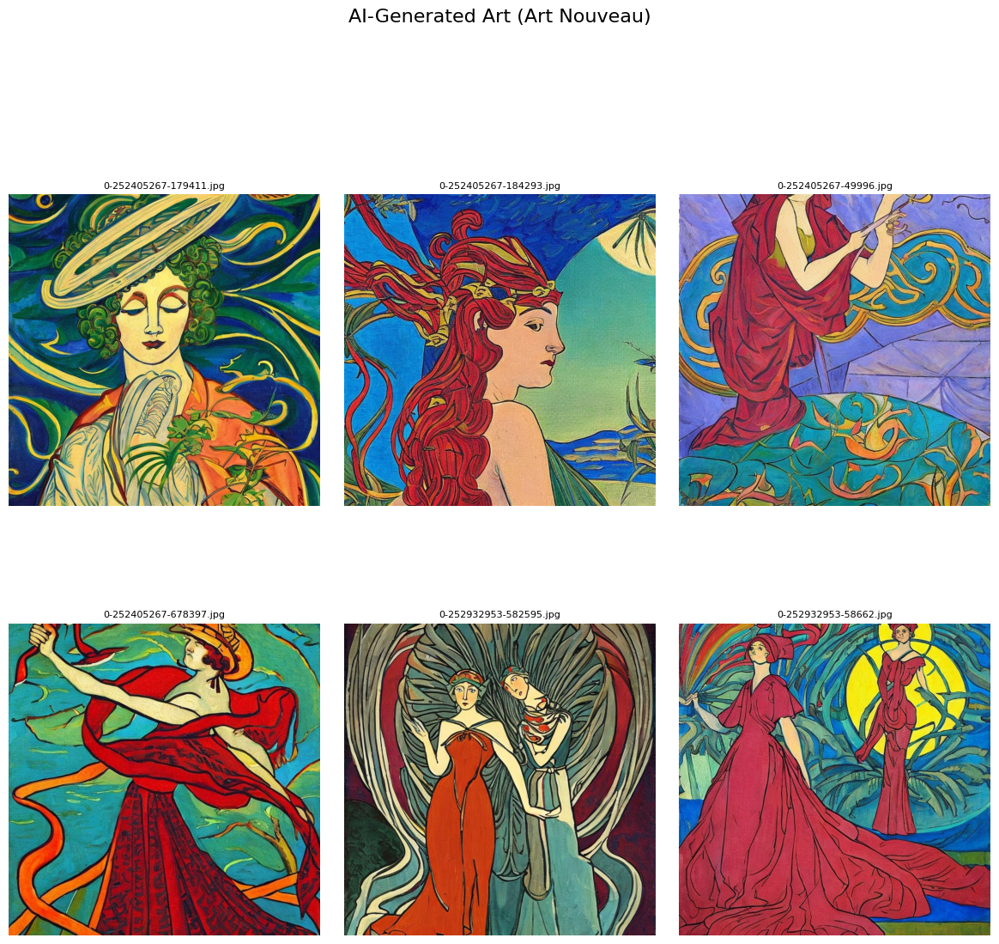

In [ ]:
# Visualize the first 6 images from the AI-generated art folder
plot_im(directory=ai_directory, k=6, title='AI-Generated Art (Art Nouveau)')

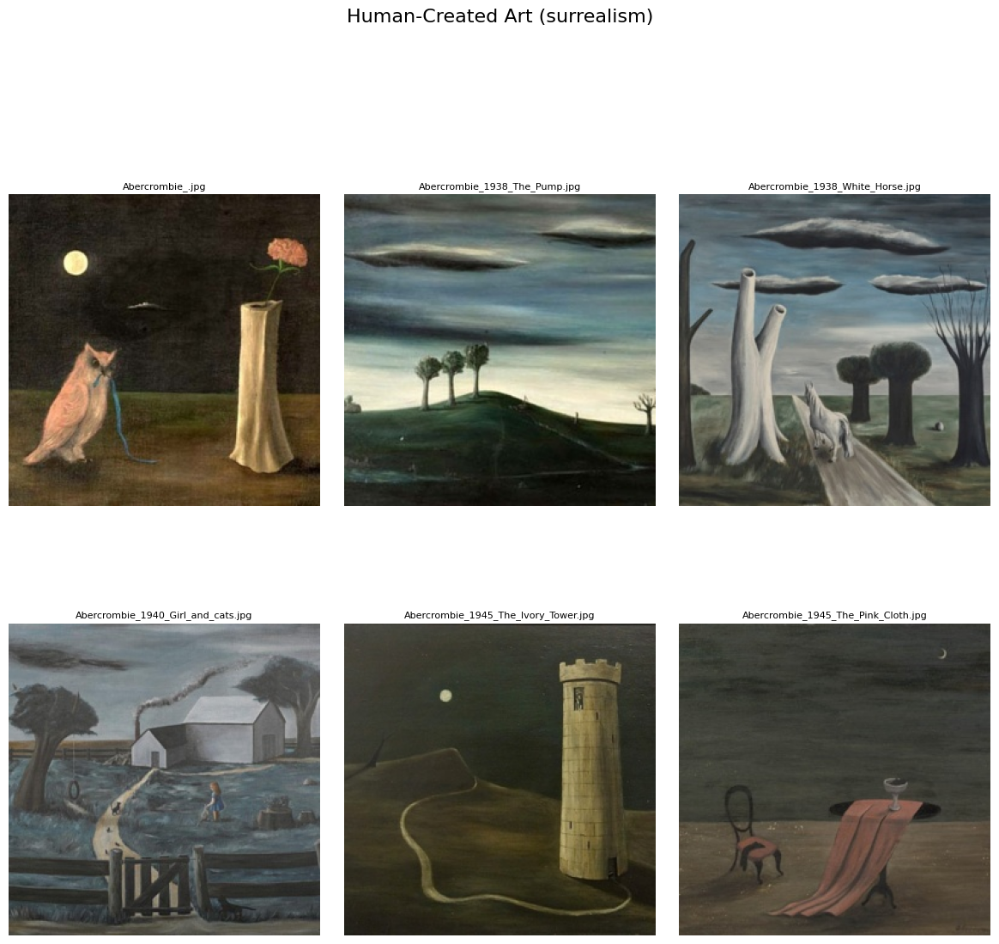

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to plot the first k images from a specified directory
def plot_im(directory, k, title):
    # Get the sorted list of files in the directory and select the first k images
    files = sorted(os.listdir(directory))[:k]

    # Create a figure with a defined size
    fig = plt.figure(figsize=(12, 12))

    # Calculate the number of rows and columns for the grid
    rows = int(np.sqrt(k))
    cols = int(np.ceil(k / rows))

    for i in range(k):
        im_i_path = os.path.join(directory, files[i])  # File path
        im_i = cv2.imread(im_i_path)
        im_i = cv2.cvtColor(im_i, cv2.COLOR_BGR2RGB)  # Convert color format for correct display

        # Add subplot
        ax = fig.add_subplot(rows, cols, i + 1)

        # Plot image
        ax.imshow(im_i)
        ax.axis('off')

        # Display filename below the image
        ax.set_title(files[i], fontsize=8, pad=5)

    # Adjust layout to increase space between images
    fig.suptitle(title, fontsize=16, y=1.02)
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    plt.tight_layout(pad=2)  # Adjust layout with some padding
    plt.show()

# Specify paths for human-created and AI-generated art folders
human_directory = '/content/real-ai-art/Real_AI_SD_LD_Dataset/train/surrealism'
ai_directory = '/content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_SD_surrealism'

# Visualize the first 6 images from the human-created art folder
plot_im(directory=human_directory, k=6, title='Human-Created Art (surrealism)')


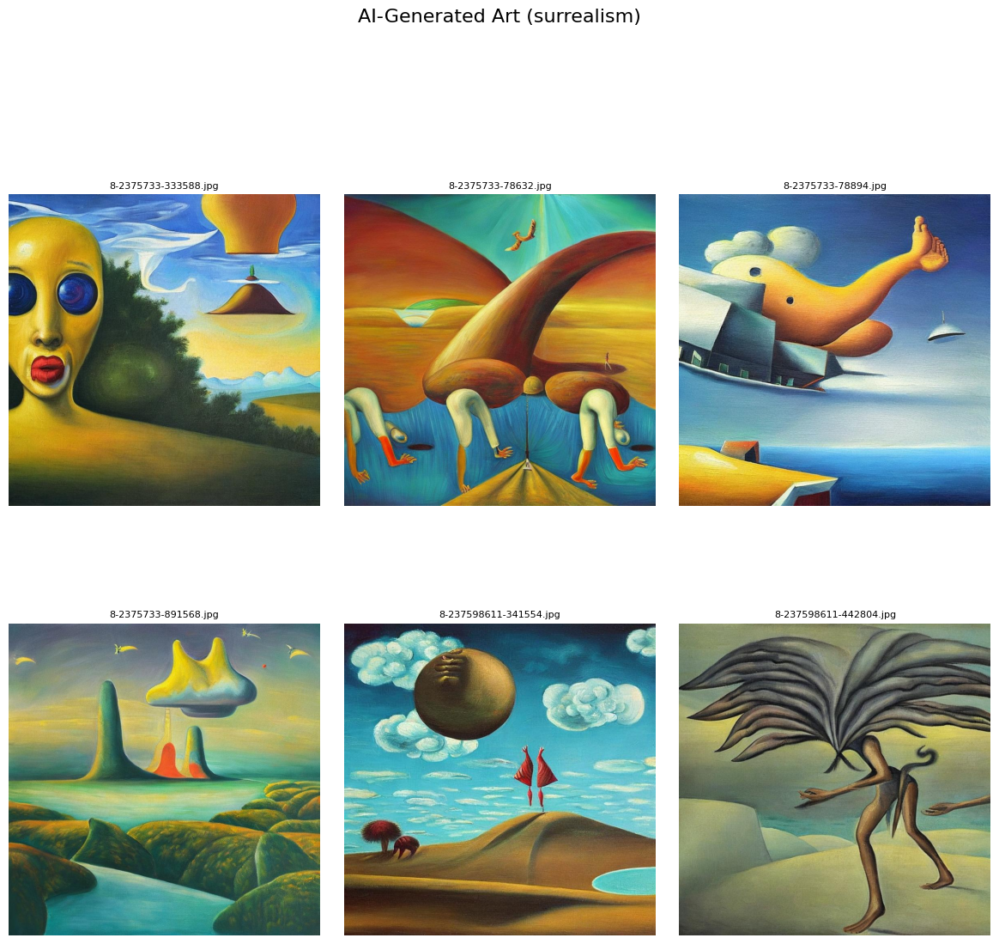

In [ ]:
# Visualize the first 6 images from the AI-generated art folder
plot_im(directory=ai_directory, k=6, title='AI-Generated Art (surrealism)')

In [ ]:
# Initialize lists to store file paths and labels
filepaths = []
labels = []

# Initialize an empty DataFrame for train_data
train_data = pd.DataFrame(columns=['filepath', 'label'])

# Label files under train_human as "human"
for directory in train_human:
    for file in os.listdir(directory):
        filepath = os.path.join(directory, file)
        filepaths.append(filepath)
        labels.append("human")

# Label files under train_ai as "AI"
for directory in train_ai:
    for file in os.listdir(directory):
        filepath = os.path.join(directory, file)
        filepaths.append(filepath)
        labels.append("AI")

# Create a DataFrame with file paths and labels
data = pd.DataFrame({'filepath': filepaths, 'label': labels})

# Concatenate data with train_data
train_data = pd.concat([train_data, data], ignore_index=True)

In [ ]:
# Display the first few rows of the train_data DataFrame
print(train_data.head())

                                            filepath  label
0  /content/real-ai-art/Real_AI_SD_LD_Dataset/tra...  human
1  /content/real-ai-art/Real_AI_SD_LD_Dataset/tra...  human
2  /content/real-ai-art/Real_AI_SD_LD_Dataset/tra...  human
3  /content/real-ai-art/Real_AI_SD_LD_Dataset/tra...  human
4  /content/real-ai-art/Real_AI_SD_LD_Dataset/tra...  human


In [ ]:
# Count the number of files under each label
file_counts = train_data['label'].value_counts()

# Print the counts
print("Number of files under each label:")
print(file_counts)

Number of files under each label:
label
AI       105015
human     50000
Name: count, dtype: int64


In [ ]:
# Function to visualize paired images with error handling
def plot_paired_images(paired_data, num_pairs=5):
    # Ensure we do not request more pairs than available
    num_pairs = min(num_pairs, len(paired_data))

    if num_pairs == 0:
        print("No pairs available for visualization.")
        return

    fig, axes = plt.subplots(num_pairs, 2, figsize=(10, 2 * num_pairs))

    for i in range(num_pairs):
        human_img = plt.imread(paired_data['human_filepath'].iloc[i])
        ai_img = plt.imread(paired_data['ai_filepath'].iloc[i])

        axes[i, 0].imshow(human_img)
        axes[i, 0].set_title('Human Image')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(ai_img)
        axes[i, 1].set_title('AI Image')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize the first 5 pairs of images
plot_paired_images(paired_data, num_pairs=5)


No pairs available for visualization.


In [ ]:
print(paired_data)
print(f"Number of pairs available: {len(paired_data)}")


Empty DataFrame
Columns: [human_filepath, ai_filepath]
Index: []
Number of pairs available: 0


In [ ]:
print("Human Directories:")
for directory in train_human:
    print(directory)

print("\nAI Directories:")
for directory in train_ai:
    print(directory)

Human Directories:
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/romanticism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/impressionism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/surrealism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/realism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/art_nouveau
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/expressionism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/renaissance
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/post_impressionism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/baroque

AI Directories:
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_SD_expressionism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_LD_post_impressionism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_LD_surrealism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_SD_realism
/content/real-ai-art/Real_AI_SD_LD_Dataset/train/AI_SD_renaissance
/content/real-ai-

In [ ]:
import os
import pandas as pd

# Initialize lists to store file paths
human_images = []  # List for human images
ai_images = []     # List for AI images

# Populate human_images from the directories you've already defined
for directory in train_human:
    files = os.listdir(directory)
    image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg'))]  # Valid image extensions
    human_images.extend([os.path.join(directory, f) for f in image_files])
    print(f"Human Directory: {directory}, Number of Images Found: {len(image_files)}")

# Populate ai_images from the directories you've already defined
for directory in train_ai:
    files = os.listdir(directory)
    image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg'))]  # Valid image extensions
    ai_images.extend([os.path.join(directory, f) for f in image_files])
    print(f"AI Directory: {directory}, Number of Images Found: {len(image_files)}")

# Print the number of images found
print(f"Total Human Images: {len(human_images)}")
print(f"Total AI Images: {len(ai_images)}")

# Create pairs (ensure they are of equal length or handle accordingly)
min_length = min(len(human_images), len(ai_images))
paired_data = pd.DataFrame({
    'human_filepath': human_images[:min_length],
    'ai_filepath': ai_images[:min_length]
})

# Check the paired_data DataFrame
print(paired_data.head())  # Show the first few pairs
print(f"Number of pairs available: {len(paired_data)}")


Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/romanticism, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/impressionism, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/ukiyo_e, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/surrealism, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/realism, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/art_nouveau, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/expressionism, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/renaissance, Number of Images Found: 5000
Human Directory: /content/real-ai-art/Real_AI_SD_LD_Dataset/train/post_impressionism, Number of Images Found: 5000
Human Directory: /content/

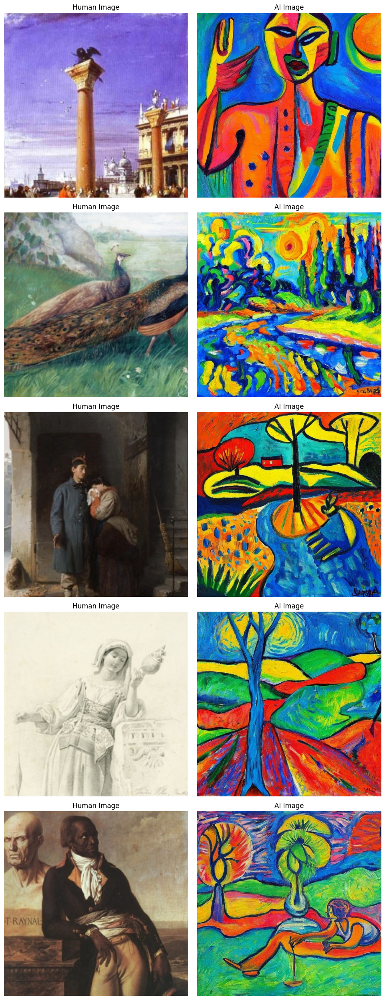

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Function to plot paired images
def plot_paired_images(paired_data, num_pairs=5):
    # Create a figure for plotting
    fig, axes = plt.subplots(num_pairs, 2, figsize=(10, 5 * num_pairs))

    for i in range(num_pairs):
        # Load human image
        human_img = cv2.imread(paired_data['human_filepath'].iloc[i])
        human_img = cv2.cvtColor(human_img, cv2.COLOR_BGR2RGB)

        # Load AI image
        ai_img = cv2.imread(paired_data['ai_filepath'].iloc[i])
        ai_img = cv2.cvtColor(ai_img, cv2.COLOR_BGR2RGB)

        # Display images
        axes[i, 0].imshow(human_img)
        axes[i, 0].axis('off')
        axes[i, 0].set_title('Human Image')

        axes[i, 1].imshow(ai_img)
        axes[i, 1].axis('off')
        axes[i, 1].set_title('AI Image')

    plt.tight_layout()
    plt.show()

# Visualize the first 5 pairs of images
plot_paired_images(paired_data, num_pairs=5)


In [ ]:
!pip install tensorflow

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

In [ ]:
# Paths for training and testing datasets
train_dir = '/content/real-ai-art/Real_AI_SD_LD_Dataset/train'
test_dir = '/content/real-ai-art/Real_AI_SD_LD_Dataset/test'


In [ ]:
# Image data generator for training with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Image data generator for validation/testing
test_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # ResNet101 input size
    batch_size=32,
    class_mode='binary',  # Assuming two classes: AI and human
    shuffle=True
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)


Found 155015 images belonging to 30 classes.
Found 30000 images belonging to 30 classes.


In [ ]:
# Load the ResNet101 model with pretrained weights
base_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers on top
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)  # Binary classification

# Create the complete model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
# Set up callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size,
    epochs=30,  # Adjust epochs as needed
    callbacks=[early_stopping, model_checkpoint]
)


ValueError: The filepath provided must end in `.keras` (Keras model format). Received: filepath=best_model.h5

In [ ]:
# Set up callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True)  # Updated file extension

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size,
    epochs=30,  # Adjust epochs as needed
    callbacks=[early_stopping, model_checkpoint]
)




Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


   8/4844 ━━━━━━━━━━━━━━━━━━━━ 16:30:50 12s/step - accuracy: 0.0259 - loss: -79.1343

KeyboardInterrupt: 

In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test Loss: {test_loss}, Test Accuracy: {test_accuracy}')

# Plot training & validation accuracy and loss
plt.figure(figsize=(12, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()

  4/938 ━━━━━━━━━━━━━━━━━━━━ 3:05:13 12s/step - accuracy: 0.0000e+00 - loss: 32.1303

KeyboardInterrupt: 